<a href="https://colab.research.google.com/github/Stephyj2/Capstone-project-2/blob/main/Capstone_Project_2_(P448_Clustering_Global_Development).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Cluster Analysis**






- **Business Objective:** Creating clusters on global development measurement dataset
- **Data Set Details:**
The dataset has information about important economic and development metrics related to various countries across the globe.

- **Variable Description:**
Birth Rate, Business tax, CO2emissions, Country, Days to start business, Ease of business, energy usage, GDP, healthexp%GDP, healthexp/capita, hours to do tax, infant mortality, internet usage, lending rate, life expectancy female, etc.

**Acceptance Criterion:**
Work on different clustering models, do a comparative analysis and need to deploy the clustering application on streamlit, flask etc.
Milestones:
30 days to complete the Project


#Intial Observations
**The dataset contains the following variables related to global development metrics:**

1.	**Birth Rate**
2.	**Business Tax Rate** (with missing values)
3.	**CO2 Emissions**
4.	**Country**
5.	**Days to Start Business** (with missing values)
6.	**Ease of Business** (with missing values)
7.	**Energy Usage**
8.	**GDP** (formatted with currency symbols and commas)
9.	**Health Expenditure** (% GDP)
10.	**Health Expenditure per Capita** (formatted with currency symbols)
11.	**Life Expectancy** (Female and Male)
12.	**Mobile Phone Usage**
13.	**Number of Records**
14.	**Population Segmentation** (0-14, 15-64, 65+)
15.	**Population** (Total and Urban)
16.	**Tourism Inbound and Outbound** (formatted with currency symbols)


In [1]:
#Loading the libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import KMeans, AgglomerativeClustering, SpectralClustering,DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, davies_bouldin_score

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


###**Step 1: Data Exploration**

####**1.1 Data Loading and Exploratory Data Analysis.**


In [4]:
#Load dataset
#data_cluster = pd.read_excel("World_development_mesurement.xlsx")
data_cluster = pd.read_excel("/content/drive/MyDrive/World_development_mesurement.xlsx")
#First few rows
data_cluster.head()

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,NaN,26998.0,"$54,790,058,957",0.035,$60,...,67.0,0.0,1,0.342,0.619,0.039,31719449,0.599,"$102,000,000","$193,000,000"
1,0.050,NaN,9542.0,Angola,NaN,NaN,7499.0,"$9,129,594,819",0.034,$22,...,44.0,0.0,1,0.476,0.499,0.025,13924930,0.324,"$34,000,000","$146,000,000"
2,0.043,NaN,1617.0,Benin,NaN,NaN,1983.0,"$2,359,122,303",0.043,$15,...,53.0,0.0,1,0.454,0.517,0.029,6949366,0.383,"$77,000,000","$50,000,000"
3,0.027,NaN,4276.0,Botswana,NaN,NaN,1836.0,"$5,788,311,645",0.047,$152,...,49.0,0.1,1,0.383,0.587,0.029,1755375,0.532,"$227,000,000","$209,000,000"
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,NaN,"$2,610,959,139",0.051,$12,...,49.0,0.0,1,0.468,0.505,0.028,11607944,0.178,"$23,000,000","$30,000,000"


In [5]:
#last 5 rows
data_cluster.tail()

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
2699,NaN,NaN,NaN,Turks and Caicos Islands,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1,NaN,NaN,NaN,32427,0.911,NaN,NaN
2700,0.013,46.4%,NaN,United States,5.0,4.0,2132446.0,"$16,244,600,000,000",0.179,"$8,895",...,76.0,1.0,1,0.196,0.667,0.136,313873685,0.811,"$200,092,000,000","$126,573,000,000"
2701,0.015,41.9%,NaN,Uruguay,7.0,85.0,NaN,"$50,004,354,667",0.089,"$1,308",...,74.0,1.5,1,0.220,0.639,0.140,3395253,0.948,"$2,222,000,000","$1,028,000,000"
2702,0.020,61.9%,NaN,"Venezuela, RB",144.0,180.0,NaN,"$381,286,223,859",0.046,$593,...,72.0,1.0,1,0.288,0.652,0.060,29954782,0.889,"$904,000,000","$3,202,000,000"
2703,0.011,NaN,NaN,Virgin Islands (U.S.),NaN,NaN,NaN,NaN,NaN,NaN,...,76.0,NaN,1,0.206,0.641,0.152,105275,0.949,NaN,NaN


In [6]:
data_cluster.shape

(2704, 25)

**2,704 rows and 25 columns**

In [7]:
data_cluster.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 25 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Birth Rate              2585 non-null   float64
 1   Business Tax Rate       1423 non-null   object 
 2   CO2 Emissions           2125 non-null   float64
 3   Country                 2704 non-null   object 
 4   Days to Start Business  1718 non-null   float64
 5   Ease of Business        185 non-null    float64
 6   Energy Usage            1785 non-null   float64
 7   GDP                     2494 non-null   object 
 8   Health Exp % GDP        2395 non-null   float64
 9   Health Exp/Capita       2395 non-null   object 
 10  Hours to do Tax         1416 non-null   float64
 11  Infant Mortality Rate   2444 non-null   float64
 12  Internet Usage          2531 non-null   float64
 13  Lending Interest        1880 non-null   float64
 14  Life Expectancy Female  2568 non-null   

**Insight:**

 In this dataset, we can see that some features have datatypes as objects because they either start with **$ (e.g., GDP, Health Exp/Capita, Tourism Inbound, and Tourism Outbound)** or end with **% (e.g., Business Tax Rate)**. However, they should be of type float.
 Therefore, we need to convert them to float type.

In [8]:
#Creating copy of original dataframe
df = data_cluster.copy()

In [9]:
# Function to convert dollar values to float
def convert_dollar_to_float(value):
    if isinstance(value, str) and value.startswith('$'):
        return float(value.replace('$', '').replace(',', ''))
    return value

# Function to convert percentage values to float
def convert_percent_to_float(value):
    if isinstance(value, str) and value.endswith('%'):
        return float(value.replace('%', '')) / 100
    return value

In [10]:
#Typcasting
# Apply the conversion to the relevant columns
df['GDP'] = df['GDP'].apply(convert_dollar_to_float)
df['Health Exp/Capita'] = df['Health Exp/Capita'].apply(convert_dollar_to_float)
df['Tourism Inbound'] = df['Tourism Inbound'].apply(convert_dollar_to_float)
df['Tourism Outbound'] = df['Tourism Outbound'].apply(convert_dollar_to_float)
df['Business Tax Rate'] = df['Business Tax Rate'].apply(convert_percent_to_float)

In [11]:
#To check datatypes
df.dtypes

,0
Birth Rate,float64
Business Tax Rate,float64
CO2 Emissions,float64
Country,object
Days to Start Business,float64
Ease of Business,float64
Energy Usage,float64
GDP,float64
Health Exp % GDP,float64
Health Exp/Capita,float64


In [12]:
df.head()

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,NaN,26998.0,5.479006e+10,0.035,60.0,...,67.0,0.0,1,0.342,0.619,0.039,31719449,0.599,102000000.0,193000000.0
1,0.050,NaN,9542.0,Angola,NaN,NaN,7499.0,9.129595e+09,0.034,22.0,...,44.0,0.0,1,0.476,0.499,0.025,13924930,0.324,34000000.0,146000000.0
2,0.043,NaN,1617.0,Benin,NaN,NaN,1983.0,2.359122e+09,0.043,15.0,...,53.0,0.0,1,0.454,0.517,0.029,6949366,0.383,77000000.0,50000000.0
3,0.027,NaN,4276.0,Botswana,NaN,NaN,1836.0,5.788312e+09,0.047,152.0,...,49.0,0.1,1,0.383,0.587,0.029,1755375,0.532,227000000.0,209000000.0
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,NaN,2.610959e+09,0.051,12.0,...,49.0,0.0,1,0.468,0.505,0.028,11607944,0.178,23000000.0,30000000.0


In [13]:
df['Number of Records'].value_counts()

,count
Number of Records,
1,2704


Since **Number of Records** column has only value, it does not provide any valuable insight hence excluding this column would be better.

In [14]:
# Dataset summary statistics
df.describe()

,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
count,2585.000000,1423.000000,2.125000e+03,1718.000000,185.000000,1.785000e+03,2.494000e+03,2395.000000,2395.000000,1416.000000,...,2568.000000,2537.000000,2704.0,2484.000000,2484.000000,2484.000000,2.704000e+03,2678.000000,2.336000e+03,2.233000e+03
mean,0.022715,0.489669,1.423071e+05,39.999418,94.875676,7.723684e+04,2.638540e+11,0.064170,801.397077,302.068503,...,66.461838,0.578124,1.0,0.303051,0.623481,0.073465,3.145729e+07,0.562953,4.939320e+09,4.729435e+09
std,0.011338,0.409541,6.159288e+05,57.318588,54.791906,2.599239e+05,1.129910e+12,0.026325,1473.448036,273.299686,...,9.390217,0.474647,0.0,0.106577,0.069660,0.049541,1.242894e+08,0.245897,1.385098e+10,1.326774e+10
min,0.007000,0.082000,7.000000e+00,1.000000,1.000000,8.000000e+00,6.310127e+07,0.008000,2.000000,12.000000,...,37.000000,0.000000,1.0,0.118000,0.474000,0.003000,1.887600e+04,0.082000,7.000000e+05,2.000000e+05
25%,0.013000,0.324000,1.360000e+03,13.000000,48.000000,3.737000e+03,3.539042e+09,0.046000,50.000000,156.000000,...,61.000000,0.100000,1.0,0.204750,0.559000,0.033000,8.783360e+05,0.356000,1.250000e+08,1.100000e+08
50%,0.020000,0.410000,8.529000e+03,26.000000,94.000000,1.433800e+04,1.507975e+10,0.061000,193.000000,239.000000,...,69.000000,0.500000,1.0,0.299500,0.642500,0.052000,5.800324e+06,0.560000,6.885000e+08,4.560000e+08
75%,0.031000,0.515500,5.910800e+04,45.000000,142.000000,4.185200e+04,1.102047e+11,0.079000,665.000000,344.750000,...,73.250000,0.900000,1.0,0.402000,0.676000,0.112000,2.014089e+07,0.765000,3.601500e+09,2.842000e+09
max,0.053000,3.391000,8.286892e+06,694.000000,189.000000,2.727728e+06,1.624460e+13,0.225000,9908.000000,2600.000000,...,88.000000,2.900000,1.0,0.500000,0.858000,0.244000,1.350695e+09,1.000000,2.000920e+11,1.265730e+11


**Large Variations in Economic and Development Indicators**
- **CO2 Emissions:** Range from 7 to over 8 million metric tons, indicating a large disparity in environmental impact.
- **GDP:** Spans from 63 million to 16.24 trillion dollars, showing the need for careful scaling to avoid dominance in clustering.
- **Energy Usage:** Varies from 8 to 2.7 million, reflecting differences in industrialization and energy access.

**Ease of Business and Days to Start a Business**
- **Ease of Business:** Ranges from 1 (easiest) to 189 (most difficult), showing different regulatory environments.
- **Days to Start a Business:** Varies from 1 day to 694 days, highlighting differences in bureaucratic efficiency.

**Population and Urbanization**
- **Population Urban:** Ranges from 8.2% to 100%, indicating levels of urbanization.
- **Population Distribution:** Significant variation in the age group distribution (0-14, 15-64, 65+), affecting a country’s development needs.

**Health and Life Expectancy**
- **Health Expenditure (% GDP):** Varies from 0.008% to 22.5%, showing differences in national health investments.
- **Per Capita Health Expenditure:** Ranges from 2 to 9,908, highlighting disparities in healthcare spending.
- **Life Expectancy:** Female ranges from 39 to 87 years, male from 37 to 88 years, reflecting diverse health outcomes.

**Tourism Inbound and Outbound**
- **Tourism Inbound:** Varies from 700,000 to over 200 billion visitors, showing major differences in tourism’s economic significance across countries.

The data suggests that some countries are **highly urbanized, wealthy, and business-friendly**, while others may be at the other end of the spectrum, providing a good basis for **clustering into distinct groups based on development patterns.**

In [15]:
# remove the "Number of Records" column from your dataset
df = df.drop(columns=['Number of Records'])

In [16]:
#To check for missing values
df.isnull().sum()

,0
Birth Rate,119
Business Tax Rate,1281
CO2 Emissions,579
Country,0
Days to Start Business,986
Ease of Business,2519
Energy Usage,919
GDP,210
Health Exp % GDP,309
Health Exp/Capita,309


In [17]:
# finding the duplicate values in the dataset
df.duplicated().sum()

0

####**1.2 Data Visualisation**

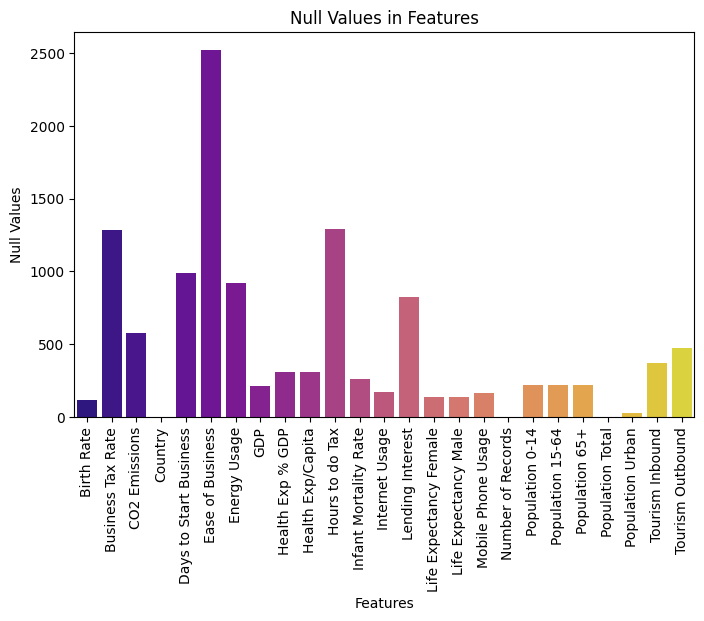

In [18]:
#Graphical representation of missing values
null = data_cluster.isnull().sum()
# Plot of Missing Values
plt.figure(figsize=(8, 5))
sns.barplot(x=null.index, y=null, palette='plasma')
plt.xlabel('Features')
plt.ylabel('Null Values')
plt.title('Null Values in Features')
plt.xticks(rotation=90)
plt.show()

The above plot shows that the most of the features in the data contains significant **NaN values** and treating them is needed. **Ease of Business column** contains **2519 missing values**, hence **dropping** this column from the data would be better for further analysis.

**Univariate Variable**

In [19]:
# Extracting Numerical Values
numerical_df = df.select_dtypes(include=['number'])

**Histogram**

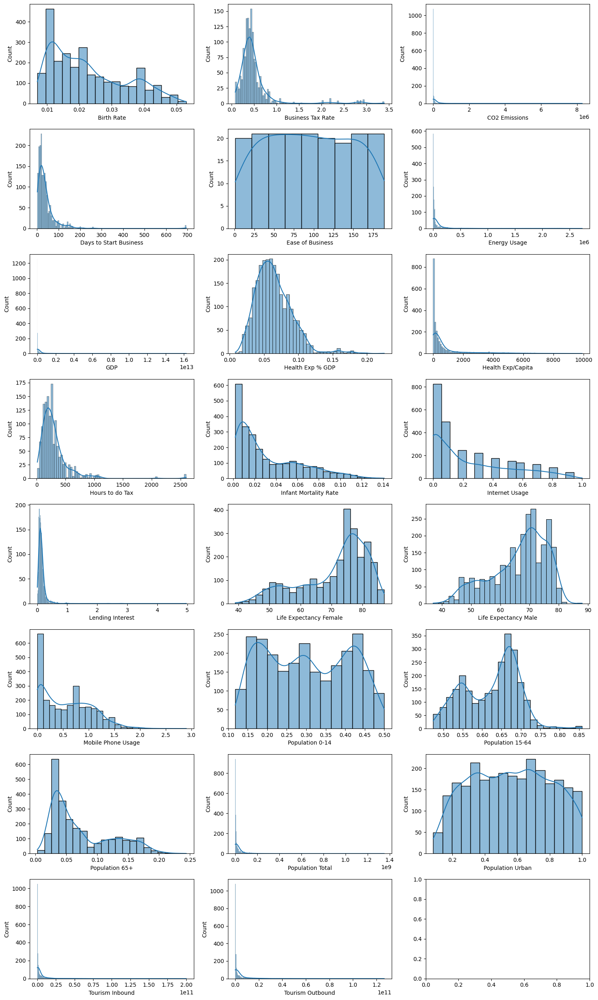

In [20]:
# Create subplots
fig, axes = plt.subplots(8, 3, figsize=(15, 25))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Iterate through numerical columns and plot
for i, col in enumerate(numerical_df):
    sns.histplot(numerical_df[col], kde=True, ax=axes[i])
    #axes[i].set_title(col)

# Adjust layout
plt.tight_layout()
plt.show()

***Histogram Insights***

The histograms illustrate the distribution of various demographic and economic indicators, revealing several key patterns:

1. **Birth Rate**: The distribution is right-skewed, indicating that a majority of countries have lower birth rates, with fewer countries having higher rates.

2. **Business Tax Rate**: This variable shows a more uniform distribution, suggesting variability among countries regarding their tax rates.

3. **Days to Start a Business**: The distribution is heavily skewed to the left, indicating that most countries require fewer days to establish a business, while some have significantly longer durations.

4. **Ease of Business**: This indicator also appears relatively uniform, indicating diverse experiences in starting and operating businesses across different countries.

5. **GDP**: The distribution is highly right-skewed, showing a concentration of lower GDP values and a few countries with extremely high GDPs.

6. **Health Expenditure (% of GDP)**: This variable has a somewhat normal distribution but with more concentration towards the lower end, indicating that many countries spend a smaller percentage of their GDP on health.

7. **Infant Mortality Rate**: The histogram is left-skewed, indicating that most countries experience lower infant mortality rates, with only a few countries facing significantly higher rates.

8. **Life Expectancy**: The distributions for both females and males exhibit a slight right skew, suggesting that most individuals live into their 70s and 80s.

9. **Population Distribution**: The population categories (0-14 years, 15-64 years, and 65+) exhibit right-skewed distributions, indicating that the majority of the population in most countries is within the younger age ranges.

10. **Tourism Inbound/Outbound**: Both indicators show a significant right skew, indicating a few countries receive or generate a disproportionately high level of tourism compared to the majority.

Overall, these distributions highlight significant disparities across countries in terms of economic performance, health outcomes, and demographic factors, which may warrant further investigation and targeted policy interventions.


**Box Plots**

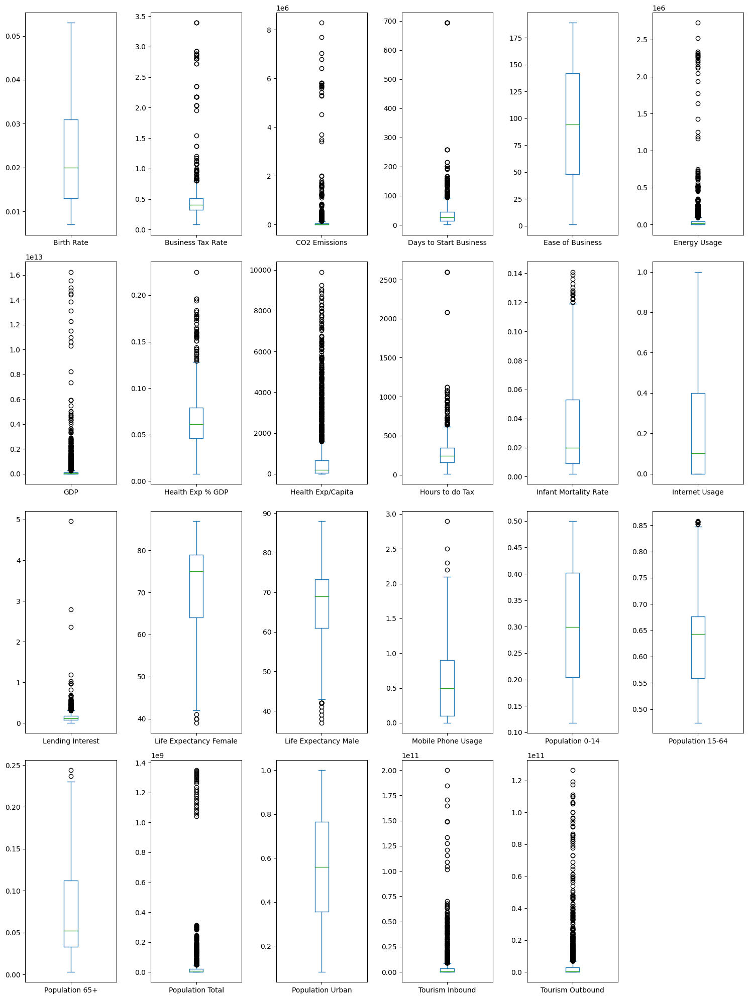

In [21]:
# Box plots
numerical_df.plot(kind='box', subplots=True, layout=(4, 6), figsize=(15, 20), sharex=False, sharey=False)
plt.tight_layout()
plt.show()

**Outliers Detected:**
- **Business Tax Rate:** Many outliers above the upper limit.
- **CO2 Emissions:** Numerous outliers, indicating countries with extremely high emissions.
- **Days to Start Business:** Several outliers representing long business setup durations.
- **GDP:** Numerous outliers showing vast economic disparities.
- **Health Expenditure (% of GDP and Per Capita):** Many outliers, especially countries with high healthcare spending.
- **Hours to do Tax:** Outliers indicating countries with prolonged tax processes.
- **Infant Mortality Rate:** Higher-end outliers, signaling high mortality rates in some countries.
- **Lending Interest:** Some high outliers.
- **Tourism Inbound and Outbound:** Numerous outliers indicating countries with unusually high tourism volumes.

**Few or No Outliers:**
- **Ease of Business, Energy Usage, Life Expectancy (Female & Male):** Broad distribution with few outliers.
- **Internet Usage, Population Age Groups, Mobile Phone Usage:** Minimal outliers, showing more uniform distributions.

**Correlation Matrix**

In [22]:
#correlation
corr = df.corr(numeric_only=True)

**Heatmap**

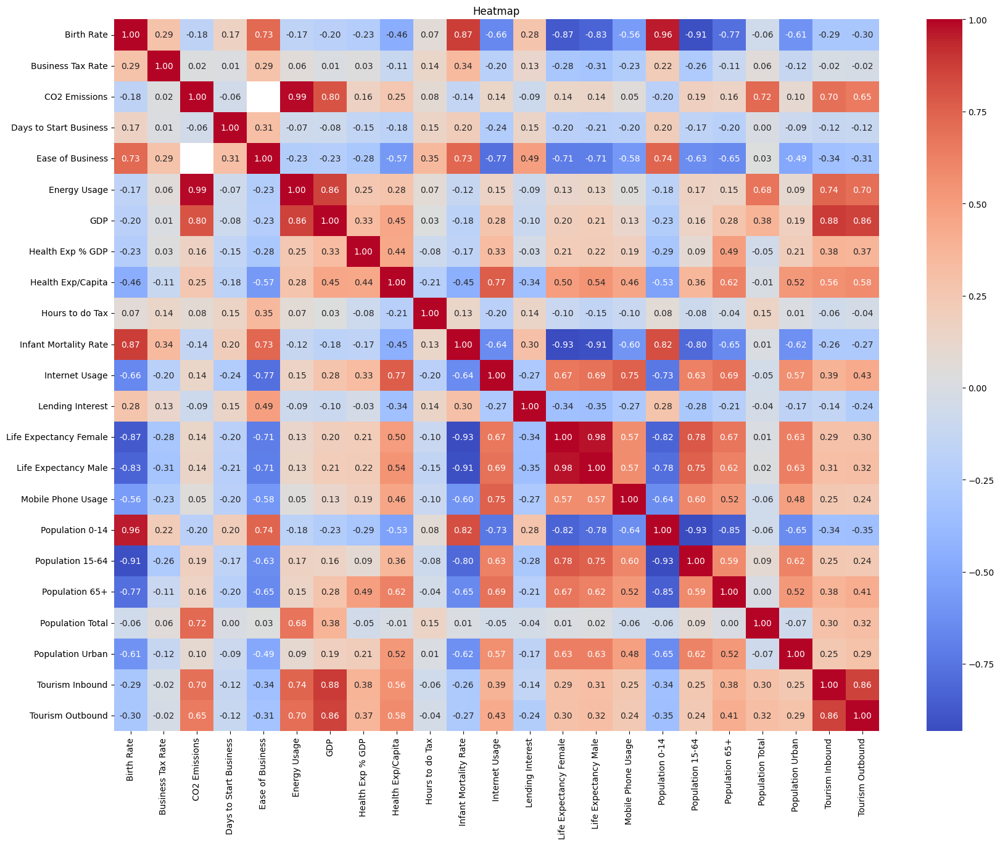

In [23]:
# Heatmap
plt.figure(figsize=(20, 15))
sns.heatmap(corr,annot=True,fmt=".2f", cmap='coolwarm')
plt.title("Heatmap")
plt.show()

***Correlation Matrix Insights***

**Strong Correlations:**
- **CO2 Emissions & Energy Usage:** Almost perfect **positive correlation (0.99)**, indicating that higher energy usage leads to higher CO2 emissions.
- **Life Expectancy (Female & Male):** **High positive correlation (0.98)**, showing both genders experience similar health conditions across countries.
- **GDP & CO2 Emissions/Energy Usage:** Strong **positive correlation (~0.86)**, suggesting wealthier countries have higher emissions and energy consumption.
- **Population 15-64 & Population Total:**  **High positive correlation (0.88)**, reflecting that the working-age population is a key part of total population.
- **Mobile Phone Usage & Internet Usage:** **Strong correlation (0.75)**, indicating more mobile usage often accompanies higher internet access.

**Weak/Negative Correlations:**
- **Infant Mortality & Life Expectancy (Female):** **Strong negative correlation (-0.91)**, as higher infant mortality is associated with lower life expectancy.
- **Health Expenditure (% of GDP) & Life Expectancy (Female):** **Moderate positive correlation (0.49)**, implying that higher health spending relates to improved life expectancy.
- **Birth Rate & Life Expectancy (Female):** **Strong negative correlation (-0.87)**, suggesting countries with higher birth rates tend to have lower life expectancies.
- **GDP & Lending Interest:** **Negative correlation (-0.27)**, indicating wealthier countries may have lower lending interest rates.
- **Ease of Business & Days to Start Business:** **Weak negative correlation (-0.15)**, showing only a slight link between the ease of business and time required to start one.


**Variables Pairplots**

In [24]:
# Value Counts of Country
df['Country'].value_counts()

,count
Country,
Algeria,13
Angola,13
Turkey,13
Ukraine,13
United Kingdom,13
...,...
Malaysia,13
Maldives,13
Mongolia,13


**Bivariate variable**

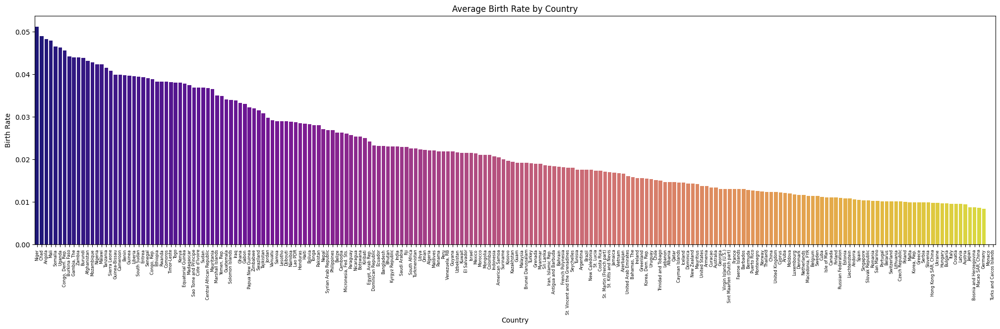

In [25]:
# Bar plot
avg_birth_rate = df.groupby('Country')['Birth Rate'].mean().reset_index()

# Sort the DataFrame by 'Birth Rate' in descending order
avg_birth_rate = avg_birth_rate.sort_values(by='Birth Rate', ascending=False)

# Plot
plt.figure(figsize=(25, 6))
sns.barplot(x='Country', y='Birth Rate', data=avg_birth_rate, palette='plasma')
plt.xticks(rotation=90, fontsize=6)
plt.title('Average Birth Rate by Country')
plt.show()

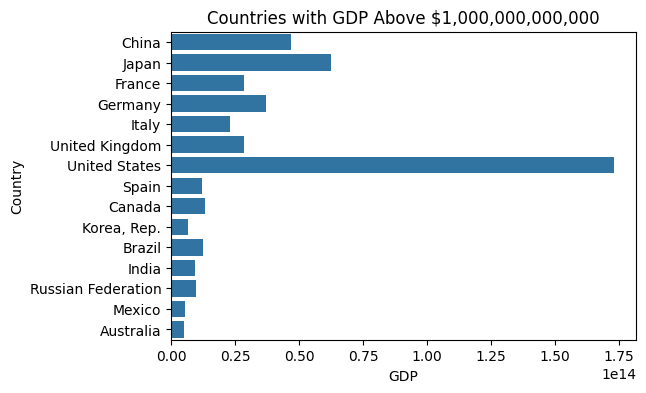

In [26]:
# Filter the dataset for countries with GDP > 1e+12
filtered_df = df[df['GDP'] > 1e+12]

# Bar plot for countries with GDP > $1,000,000,000,000
plt.figure(figsize=(6, 4))
sns.barplot(x='GDP', y='Country', data=filtered_df, estimator=sum, ci=None)
plt.title('Countries with GDP Above $1,000,000,000,000')
plt.xlabel('GDP')
plt.ylabel('Country')
plt.show()

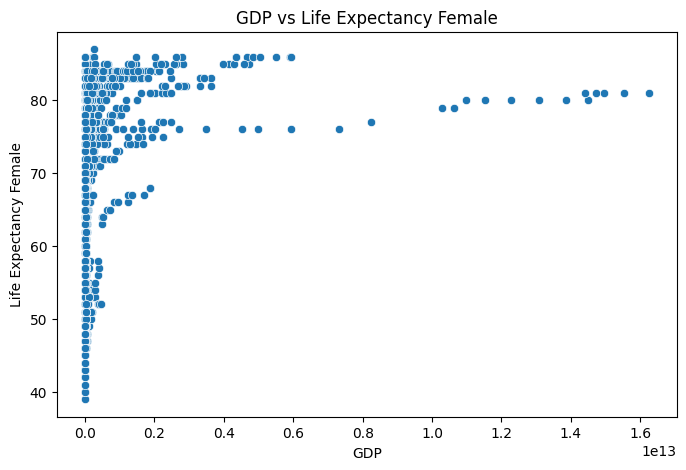

In [27]:
# GDP vs Life Expectancy Female
plt.figure(figsize=(8, 5))
sns.scatterplot(x='GDP', y='Life Expectancy Female', data=df)
plt.title('GDP vs Life Expectancy Female')
plt.xlabel('GDP')
plt.ylabel('Life Expectancy Female')
plt.show()

**Multivariate analysis**

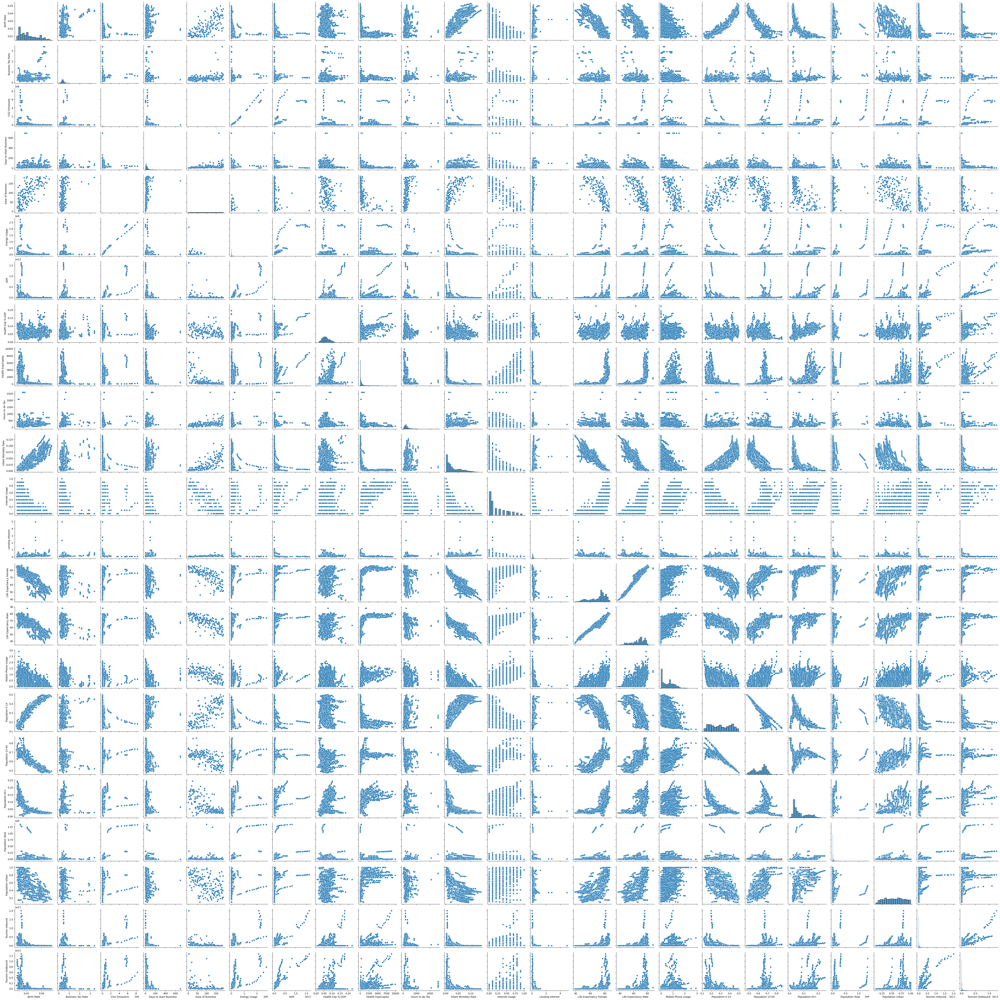

In [28]:
# Pair plot for numerical features
sns.pairplot(numerical_df)
plt.show()

###**Step 2 :Data Preprocessing**
We need to process the data for model building

In [29]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.impute import KNNImputer
import scipy.stats as stats

####**2.1 Handling Missing Values**

In [30]:
#Missing values
df.isnull().sum()

,0
Birth Rate,119
Business Tax Rate,1281
CO2 Emissions,579
Country,0
Days to Start Business,986
Ease of Business,2519
Energy Usage,919
GDP,210
Health Exp % GDP,309
Health Exp/Capita,309


**a. Drop Columns with Excessive Missing Values** <br>
We can remove Ease of Business since it has 2519 missing values. **Business Tax Rate and Hours to do Tax** have around 50% missing values, so we are dropping these columns.

In [31]:
# remove the "Ease of Business" column from your dataset
df.drop(columns=['Business Tax Rate', 'Ease of Business', 'Hours to do Tax'], inplace=True)

**b. Imputation Based on Statistical Methods**<br>
Birth Rate,
GDP,
Health Exp % GDP,
Health Exp/Capita,
Infant Mortality Rate,
Internet Usage,
Life Expectancy Female,
Life Expectancy Male,
Mobile Phone Usage,
Population 0-14,
Population 15-64,
Population 65+,
Population Urban columns are filled with the mean or median.

In [32]:
# List of columns to impute
columns_to_impute = [
    'Birth Rate', 'GDP', 'Health Exp % GDP', 'Health Exp/Capita',
    'Infant Mortality Rate', 'Internet Usage', 'Life Expectancy Female',
    'Life Expectancy Male', 'Mobile Phone Usage', 'Population 0-14',
    'Population 15-64', 'Population 65+', 'Population Urban'
]

# Impute using mean for numeric columns
for column in columns_to_impute:
    if df[column].isnull().any():  # Check if there are nulls in the column
        df[column].fillna(df[column].median(), inplace=True)  # Replace NaNs with the median

**c. Machine learning models for imputation**<br>
To impute the columns with significant missing values (Days to Start Business, Energy Usage, Lending Interest, Tourism Outbound, Tourism Inbound, and CO2 Emissions), we used various machine learning models for imputation.

In [33]:
# Define columns with significant missing values
columns_to_impute = [
    'Days to Start Business',
    'Energy Usage',
    'Lending Interest',
    'Tourism Outbound',
    'Tourism Inbound',
    'CO2 Emissions',
]

In [34]:
# Create a KNN imputer
imputer = KNNImputer(n_neighbors=5)

# Select only the columns we want to impute
# It's good practice to drop columns with too many missing values before imputation
impute_data = df[columns_to_impute]

# Perform KNN imputation
imputed_data = imputer.fit_transform(impute_data)

# Update the original DataFrame with the imputed values
df[columns_to_impute] = imputed_data

In [35]:
# This is how the data looks after handling null values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Birth Rate              2704 non-null   float64
 1   CO2 Emissions           2704 non-null   float64
 2   Country                 2704 non-null   object 
 3   Days to Start Business  2704 non-null   float64
 4   Energy Usage            2704 non-null   float64
 5   GDP                     2704 non-null   float64
 6   Health Exp % GDP        2704 non-null   float64
 7   Health Exp/Capita       2704 non-null   float64
 8   Infant Mortality Rate   2704 non-null   float64
 9   Internet Usage          2704 non-null   float64
 10  Lending Interest        2704 non-null   float64
 11  Life Expectancy Female  2704 non-null   float64
 12  Life Expectancy Male    2704 non-null   float64
 13  Mobile Phone Usage      2704 non-null   float64
 14  Population 0-14         2704 non-null   

**Histogram plots of numerical variables after treating NaN values.**

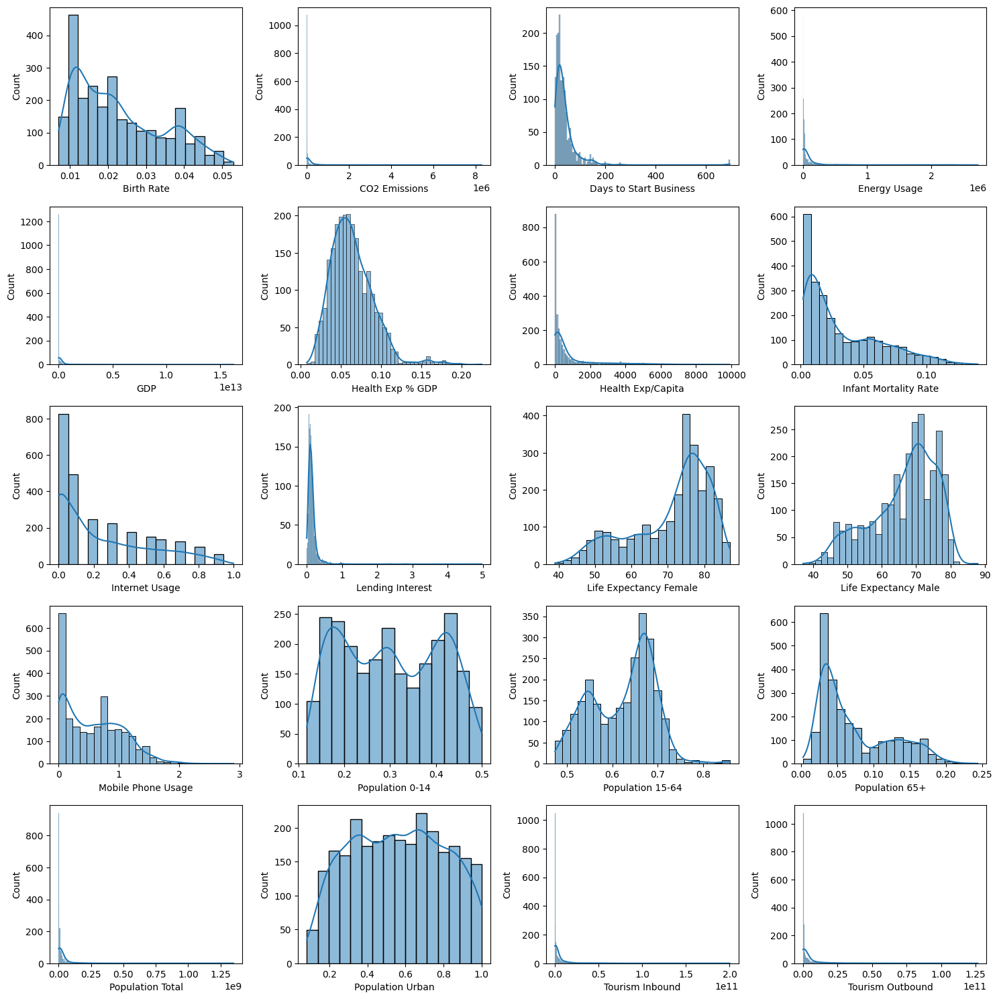

In [36]:
num_df = df.select_dtypes(include=['number'])
# Create subplots
fig, axes = plt.subplots(5, 4, figsize=(15, 15))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Iterate through numerical columns and plot
for i, col in enumerate(num_df):
    sns.histplot(numerical_df[col], kde=True, ax=axes[i])
    #axes[i].set_title(col)

# Adjust layout
plt.tight_layout()
plt.show()

####**2.2 Treating Outliers**

In [37]:
def find_outliers(df):
    outlier_counts = {}

    for column in df.select_dtypes(include=['float64', 'int64']):  # Only numeric columns
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1

        # Define the lower and upper bounds for outliers
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Count outliers
        outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
        outlier_counts[column] = outliers.shape[0]  # Number of outliers in the column

    return outlier_counts

# Call the function and print the results
outlier_counts = find_outliers(df)

# Create a DataFrame from outlier counts
outlier_counts_df = pd.DataFrame(outlier_counts.items(), columns=['Variable', 'Outlier Count'])
outlier_counts_df

,Variable,Outlier Count
0,Birth Rate,0
1,CO2 Emissions,351
2,Days to Start Business,174
3,Energy Usage,343
4,GDP,414
5,Health Exp % GDP,58
6,Health Exp/Capita,412
7,Infant Mortality Rate,49
8,Internet Usage,0
9,Lending Interest,129


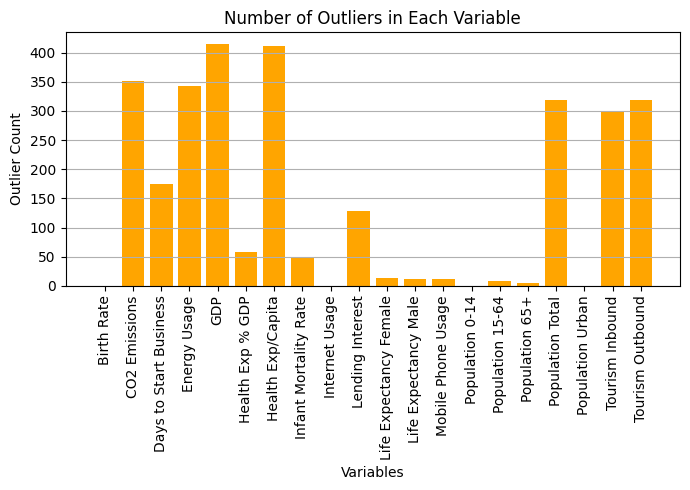

In [38]:
# Plotting the outlier counts
plt.figure(figsize=(7, 5))
plt.bar(outlier_counts_df['Variable'], outlier_counts_df['Outlier Count'], color='orange')
plt.title('Number of Outliers in Each Variable')
plt.xlabel('Variables')
plt.ylabel('Outlier Count')
plt.xticks(rotation=90)
plt.grid(axis='y')

# Show plot
plt.tight_layout()
plt.show()

**a. Treating the outliers with Capping**<br>
Setting outliers to a specified percentile, such as the 1st and 99th percentiles.

In [39]:
# Capping at 1st and 99th percentiles
def winsorize_data(data, columns, winsor_pct=0.05):
  """
  Winsorizes specified columns in a DataFrame.

  Args:
    data: The DataFrame to winsorize.
    columns: A list of column names to winsorize.
    winsor_pct: The percentage of values to cap from each tail.

  Returns:
    A new DataFrame with winsorized values.
  """

  winsorized_data = data.copy()

  for col in columns:
    # Calculate the lower and upper percentiles
    lower_percentile = stats.scoreatpercentile(data[col], winsor_pct * 100)
    upper_percentile = stats.scoreatpercentile(data[col], (1 - winsor_pct) * 100)

    # Cap values below the lower percentile and above the upper percentile
    winsorized_data[col] = np.where(data[col] < lower_percentile, lower_percentile, data[col])
    winsorized_data[col] = np.where(data[col] > upper_percentile, upper_percentile, data[col])

  return winsorized_data

In [40]:
outlier_columns = [
    'CO2 Emissions',
    'Days to Start Business',
    'Energy Usage',
    'GDP',
    'Lending Interest',
    'Population Total',
    'Tourism Inbound',
    'Tourism Outbound',
    'Health Exp/Capita'
]

# Winsorize the specified columns
updated_df = winsorize_data(df, outlier_columns, winsor_pct=0.05)

# Print the winsorized DataFrame
updated_df.head()

,Birth Rate,CO2 Emissions,Country,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Infant Mortality Rate,Internet Usage,...,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,87931.0,Algeria,47.6,26998.0,5.479006e+10,0.035,60.0,0.034,0.0,...,71.0,67.0,0.0,0.342,0.619,0.039,31719449.0,0.599,102000000.0,193000000.0
1,0.050,9542.0,Angola,16.6,7499.0,9.129595e+09,0.034,22.0,0.128,0.0,...,47.0,44.0,0.0,0.476,0.499,0.025,13924930.0,0.324,34000000.0,146000000.0
2,0.043,1617.0,Benin,72.0,1983.0,2.359122e+09,0.043,15.0,0.090,0.0,...,57.0,53.0,0.0,0.454,0.517,0.029,6949366.0,0.383,77000000.0,50000000.0
3,0.027,4276.0,Botswana,36.2,1836.0,5.788312e+09,0.047,152.0,0.054,0.0,...,52.0,49.0,0.1,0.383,0.587,0.029,1755375.0,0.532,227000000.0,209000000.0
4,0.046,1041.0,Burkina Faso,54.0,7793.6,2.610959e+09,0.051,12.0,0.096,0.0,...,52.0,49.0,0.0,0.468,0.505,0.028,11607944.0,0.178,23000000.0,30000000.0


**b. Imputation of outliers**

In [41]:
# List of variables to impute outliers with the mean
variables_to_impute = [
    'Health Exp % GDP',
    'Infant Mortality Rate',
    'Life Expectancy Female',
    'Life Expectancy Male',
    'Mobile Phone Usage',
    'Population 15-64',
    'Population 65+'
]

In [42]:
# Impute outliers with the median for each specified variable
for variable in variables_to_impute:
    median_value = df[variable].median()  # Calculate the median
    # Replace outliers with the median
    df[variable] = np.where((df[variable] < df[variable].quantile(0.01)) | (df[variable] > df[variable].quantile(0.99)), median_value, df[variable])

In [43]:
# Call the function and print the results
updated_outlier_counts = find_outliers(df)

# Create a DataFrame from outlier counts
updated_outlier_counts_df = pd.DataFrame(updated_outlier_counts.items(), columns=['Variable', 'Outlier Count'])
updated_outlier_counts_df

,Variable,Outlier Count
0,Birth Rate,0
1,CO2 Emissions,351
2,Days to Start Business,174
3,Energy Usage,343
4,GDP,414
5,Health Exp % GDP,45
6,Health Exp/Capita,412
7,Infant Mortality Rate,29
8,Internet Usage,0
9,Lending Interest,129


####**2.3 Scaling**

In [44]:
#Scale the Features
from sklearn.preprocessing import StandardScaler

# Select only numerical features for scaling
numerical_features = df.select_dtypes(include=['number']).columns # Select columns with numerical data types

# Scale the numerical features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(df[numerical_features]) # Scale only the selected numerical features

# Convert the scaled data back to a DataFrame for easy handling
df_scaled = pd.DataFrame(scaled_features, columns=numerical_features, index=df.index)  # Ensure index is maintained and only scaled columns are used

# Concatenate scaled numerical features with original non-numerical features
df_final = pd.concat([df.drop(columns=numerical_features), df_scaled], axis=1)  # Combine back with original DataFrame
#scaled dataframe
df_scaled.head()

,Birth Rate,CO2 Emissions,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Infant Mortality Rate,Internet Usage,Lending Interest,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,-0.233864,-0.069365,0.175409,-0.161951,-0.174562,-1.286749,-0.479956,0.123466,-0.908914,-0.326733,-0.053086,0.026589,-1.279469,0.384182,-0.095534,-0.693506,0.002110,0.147449,-0.383557,-0.367301
1,2.469335,-0.211582,-0.484708,-0.252043,-0.216569,-1.332675,-0.507102,-0.388632,-0.908914,6.018976,-2.442168,-2.569324,-1.279469,1.696192,-2.016394,-1.001330,-0.141087,-0.976530,-0.388742,-0.371094
2,1.838589,-0.225960,0.694985,-0.277528,-0.222797,-0.919339,-0.512102,2.171856,-0.908914,0.196175,-1.446717,-1.553532,-1.279469,1.480788,-1.728265,-0.913380,-0.197221,-0.735385,-0.385463,-0.378839
3,0.396882,-0.221136,-0.067344,-0.278207,-0.219643,-0.735634,-0.414235,0.855034,-0.908914,0.047746,-1.944443,-2.004995,-1.050123,0.785618,-0.607763,-0.913380,-0.239018,-0.126393,-0.374025,-0.366011
4,2.108909,-0.227005,0.311691,-0.250681,-0.222566,-0.551930,-0.514245,2.391326,-0.908914,0.464438,-1.944443,-2.004995,-1.279469,1.617863,-1.920351,-0.935368,-0.159732,-1.573260,-0.389581,-0.380453


#**Step3. Feature Engineering**

####**3.1 Create New Features**

In [45]:
# Example: Create GDP per capita feature
df_scaled['GDP per Capita'] = df_scaled['GDP'] / df['Population Total']

####**3.2 Dimensionality Reduction with PCA**

In [46]:
from sklearn.decomposition import PCA

# Apply PCA for dimensionality reduction (optional)
pca = PCA(n_components=2)
pca_features = pca.fit_transform(df_scaled)

# Convert to a DataFrame
df_pca = pd.DataFrame(pca_features, columns=['PCA1', 'PCA2'])

#**Step4. Model Building**

####**4.1 K-Means Clustering**


In [47]:
from sklearn.cluster import KMeans

# Elbow method to find optimal number of clusters
sse = []
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_scaled)
    sse.append(kmeans.inertia_)

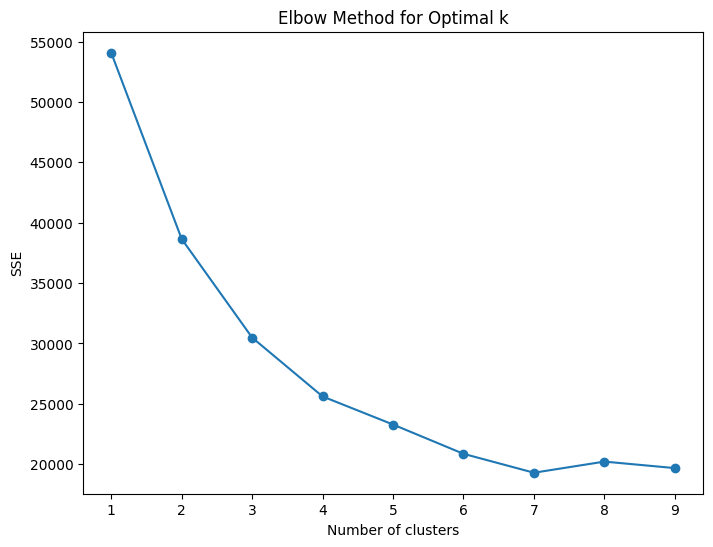

In [48]:
# Plot elbow method
plt.figure(figsize=(8,6))
plt.plot(range(1, 10), sse, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of clusters')
plt.ylabel('SSE')
plt.show()

The elbow plot shows the **Sum of Squared Errors (SSE)** for different numbers of clusters (k).<br>
Based on this plot:

- The **SSE** significantly **decreases from 1 to around 3 clusters** and starts to flatten after that point.
-The **"elbow"** appears to be around **3 or 4 clusters** since that's where the reduction in SSE starts to diminish.

**Fit K-Means for 3 and 4 Clusters**

In [49]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Fit K-Means with 3 clusters
kmeans_3 = KMeans(n_clusters=3, random_state=42)
df_scaled['KMeans_3_Clusters'] = kmeans_3.fit_predict(df_scaled)

# Fit K-Means with 4 clusters
kmeans_4 = KMeans(n_clusters=4, random_state=42)
df_scaled['KMeans_4_Clusters'] = kmeans_4.fit_predict(df_scaled)

In [50]:
# Fit K-Means with the optimal number of clusters
kmeans = KMeans(n_clusters=4, random_state=42)
df_scaled['Cluster'] = kmeans.fit_predict(df_scaled)

####**4.2 Hierarchical Clustering**

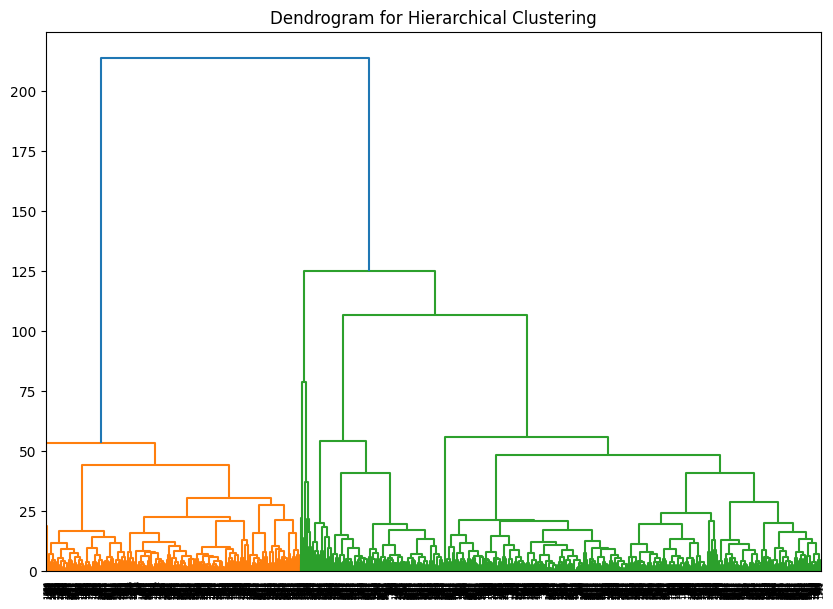

In [51]:
from scipy.cluster.hierarchy import dendrogram, linkage

# Perform hierarchical clustering
linked = linkage(df_scaled, method='ward')

# Plot dendrogram
plt.figure(figsize=(10,7))
dendrogram(linked)
plt.title('Dendrogram for Hierarchical Clustering')
plt.show()

- There are three distinct **clusters** based on where the vertical lines merge.
- The largest vertical distance without merging **(the longest "branch")** is at **3 clusters**, which indicates that the **optimal number** of clusters is likely **3.**

**Cutting the Dendrogram at 3 Clusters**

In [52]:
from scipy.cluster.hierarchy import fcluster

# Assuming you have already computed the linkage using the 'ward' method
# linked = linkage(df_scaled, method='ward')

# Cut the dendrogram to form 3 clusters
n_clusters = 3
clusters = fcluster(linked, n_clusters, criterion='maxclust')

# Add the cluster labels to the dataframe
df_scaled['Hierarchical Cluster'] = clusters

# Check the distribution of clusters
print(df_scaled['Hierarchical Cluster'].value_counts())


Hierarchical Cluster
3    1777
1     888
2      39
Name: count, dtype: int64


###**4.3 DBSCAN Clustering**

In [53]:
from sklearn.cluster import DBSCAN

# Fit DBSCAN model
dbscan = DBSCAN(eps=0.5, min_samples=5)
df_scaled['DBSCAN Cluster'] = dbscan.fit_predict(df_scaled)

#**Step5. Model Evaluation**

####**5.1 Silhouette Score**

**Evaluating K-means Clustering**

In [54]:
from sklearn.metrics import silhouette_score

# Calculate silhouette score for K-Means
kmeans_silhouette = silhouette_score(df_scaled, df_scaled['Cluster'])
print(f'Silhouette Score for K-Means: {kmeans_silhouette}')

Silhouette Score for K-Means: 0.24268459973187514


In [55]:
# Silhouette score for 3 clusters
silhouette_3 = silhouette_score(df_scaled, df_scaled['KMeans_3_Clusters'])
print(f'Silhouette Score for 3 clusters: {silhouette_3}')

# Silhouette score for 4 clusters
silhouette_4 = silhouette_score(df_scaled, df_scaled['KMeans_4_Clusters'])
print(f'Silhouette Score for 4 clusters: {silhouette_4}')


Silhouette Score for 3 clusters: 0.31435864177982725
Silhouette Score for 4 clusters: 0.24268459973187514


**A higher score indicates better clustering. So cluster = 4 is better.**

**Evaluating hierarchical Clustering**

In [56]:
# Calculate the silhouette score for the hierarchical clusters
silhouette_avg = silhouette_score(df_scaled, df_scaled['Hierarchical Cluster'])
print(f'Silhouette Score for hierarchical clustering: {silhouette_avg}')


Silhouette Score for hierarchical clustering: 0.35723660119927847


**Evaluating DBSCAN Clustering**

In [57]:
from sklearn.metrics import silhouette_score

# Filter out noise points (-1) as silhouette score only applies to clusters
non_noise_points = df_scaled[df_scaled['DBSCAN Cluster'] != -1]

# Calculate silhouette score for DBSCAN (excluding noise points)
if len(set(non_noise_points['DBSCAN Cluster'])) > 1:  # Ensure there are multiple clusters
    silhouette_avg = silhouette_score(non_noise_points, non_noise_points['DBSCAN Cluster'])
    print(f'Silhouette Score for DBSCAN (excluding noise points): {silhouette_avg}')
else:
    print("DBSCAN resulted in a single cluster. Silhouette score is not applicable.")


Silhouette Score for DBSCAN (excluding noise points): 0.8389977313225697


**Cluster Distribution and Noise Points**

In [58]:
# Check the number of points in each cluster, including noise points
cluster_counts = df_scaled['DBSCAN Cluster'].value_counts()
print("Cluster counts (including noise points):")
print(cluster_counts)

# Check the number of noise points
noise_points = len(df_scaled[df_scaled['DBSCAN Cluster'] == -1])
print(f'Number of noise points: {noise_points}')


Cluster counts (including noise points):
DBSCAN Cluster
-1     2433
 2       16
 3       14
 4       12
 17      11
 23      10
 6       10
 0       10
 8        9
 13       9
 12       9
 16       9
 10       8
 15       8
 14       7
 20       7
 22       7
 19       7
 18       6
 24       6
 7        6
 31       6
 9        5
 26       5
 36       5
 35       5
 37       5
 33       5
 29       5
 32       5
 11       5
 30       5
 5        5
 28       5
 25       5
 27       5
 21       5
 1        5
 34       4
Name: count, dtype: int64
Number of noise points: 2433


####**5.2 Cluster Visualization**

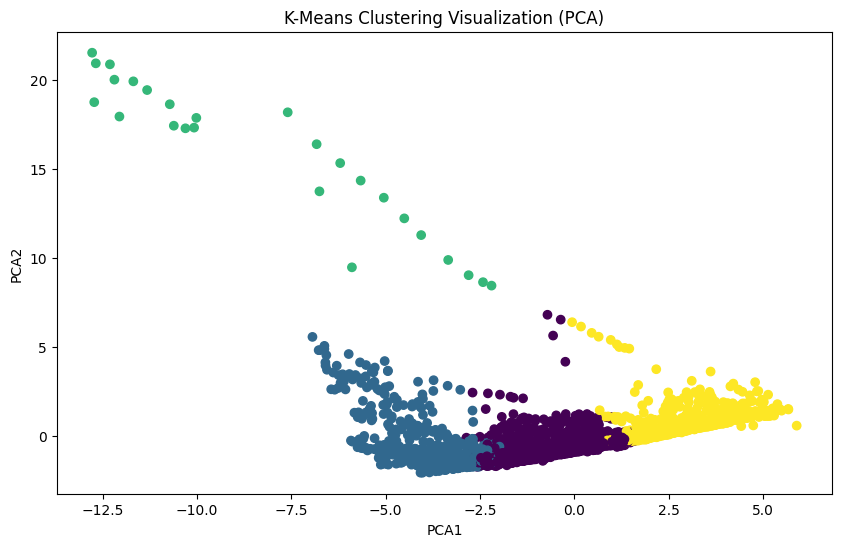

In [59]:
# Visualize clusters using PCA components
plt.figure(figsize=(10,6))
plt.scatter(df_pca['PCA1'], df_pca['PCA2'], c=df_scaled['Cluster'], cmap='viridis')
plt.title('K-Means Clustering Visualization (PCA)')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.show()

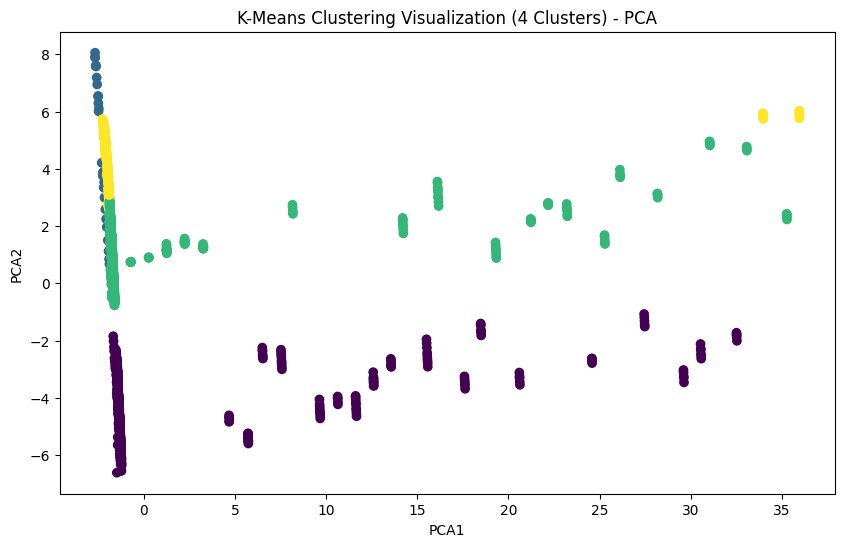

In [60]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Apply PCA to reduce dimensionality for visualization
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_scaled)

# Plot for 4 clusters
plt.figure(figsize=(10,6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=df_scaled['KMeans_4_Clusters'], cmap='viridis')
plt.title('K-Means Clustering Visualization (4 Clusters) - PCA')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.show()

**Visualize the Hierarchical Clusters Using PCA**

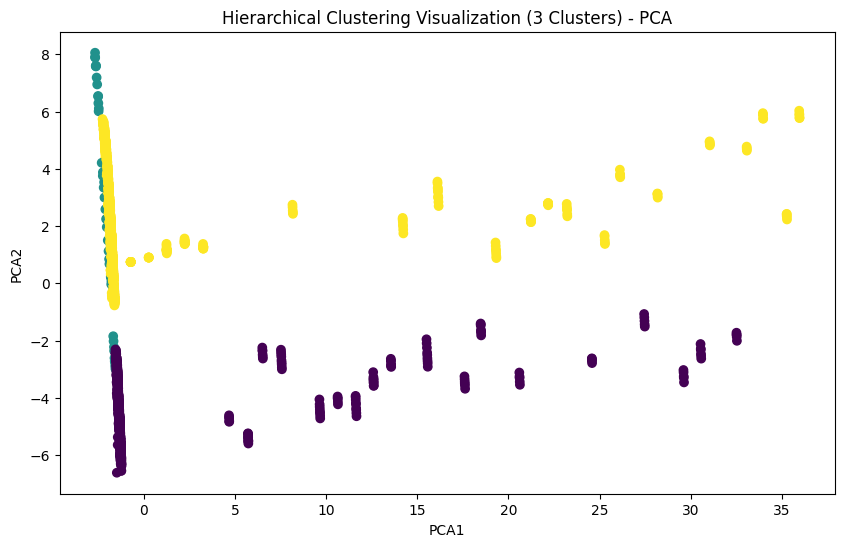

In [61]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Apply PCA to reduce dimensionality to 2 components for visualization
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_scaled)

# Plot the clusters (based on hierarchical clustering)
plt.figure(figsize=(10,6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=df_scaled['Hierarchical Cluster'], cmap='viridis')
plt.title('Hierarchical Clustering Visualization (3 Clusters) - PCA')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.show()


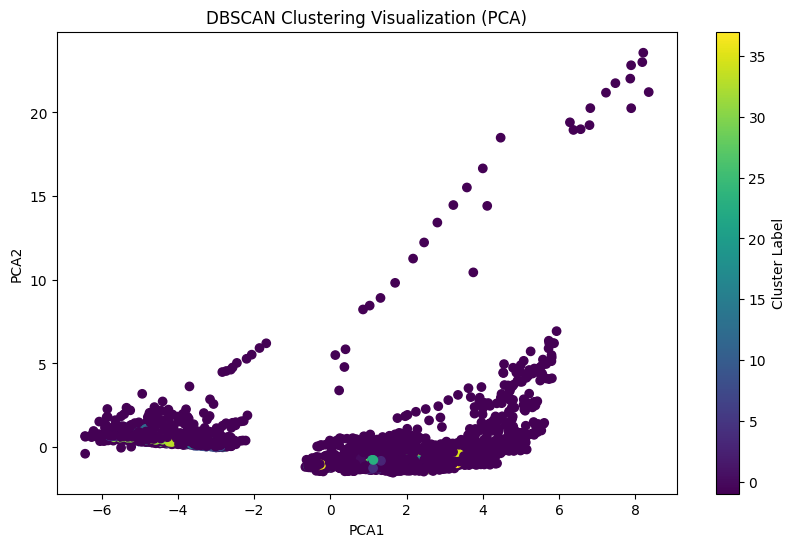

In [62]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Apply PCA to reduce dimensionality for visualization (2 components)
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_scaled.drop('DBSCAN Cluster', axis=1))  # Exclude DBSCAN Cluster for PCA

# Plot the DBSCAN clusters, including noise points (-1)
plt.figure(figsize=(10,6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=df_scaled['DBSCAN Cluster'], cmap='viridis', marker='o')
plt.title('DBSCAN Clustering Visualization (PCA)')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.colorbar(label='Cluster Label')
plt.show()

#**Comparison**

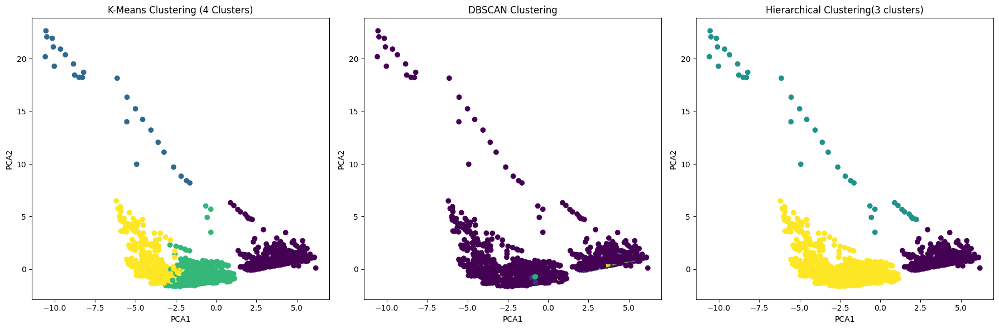

In [63]:
# Apply PCA for 2D visualization (for comparison) - adjust to drop cluster columns
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_scaled.drop(['KMeans_4_Clusters', 'DBSCAN Cluster', 'Hierarchical Cluster'], axis=1))

# Create a figure with 3 subplots (1 row, 3 columns)
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# K-Means (4 clusters)
axes[0].scatter(pca_result[:, 0], pca_result[:, 1], c=df_scaled['KMeans_4_Clusters'], cmap='viridis', marker='o')
axes[0].set_title('K-Means Clustering (4 Clusters)')
axes[0].set_xlabel('PCA1')
axes[0].set_ylabel('PCA2')

# DBSCAN Clustering
axes[1].scatter(pca_result[:, 0], pca_result[:, 1], c=df_scaled['DBSCAN Cluster'], cmap='viridis', marker='o')
axes[1].set_title('DBSCAN Clustering')
axes[1].set_xlabel('PCA1')
axes[1].set_ylabel('PCA2')

# Hierarchical Clustering
axes[2].scatter(pca_result[:, 0], pca_result[:, 1], c=df_scaled['Hierarchical Cluster'], cmap='viridis', marker='o')
axes[2].set_title('Hierarchical Clustering(3 clusters)')
axes[2].set_xlabel('PCA1')
axes[2].set_ylabel('PCA2')

# Adjust layout to make space between plots
plt.tight_layout()
plt.show()

- **K-Means Clustering (4 Clusters):** The data is divided into 4 distinct clusters, as expected from K-Means, with each cluster appearing more or less compact.
- **DBSCAN Clustering:** DBSCAN seems to have grouped most of the data into a single large cluster (purple), with several small clusters and outliers spread out. DBSCAN is good at detecting noise (outliers) and arbitrary-shaped clusters.
- **Hierarchical Clustering (3 Clusters):** The hierarchical clustering has successfully divided the data into 3 clusters, showing different patterns from K-Means, as it doesn’t assume spherical clusters.

#**Step6. Model Refinement**

**Cluster = 3**

In [71]:
# Function to apply clustering models and evaluate them
def apply_clustering_models(X, n_clusters=3, eps=0.5, min_samples=5, linkage_method='ward'):
    """
    Applies various clustering models and evaluates them using silhouette score and Davies-Bouldin index.

    Args:
    - X: Scaled dataset.
    - n_clusters: Number of clusters for models like KMeans, Agglomerative, Spectral, GMM.
    - eps: The maximum distance between two samples for DBSCAN to consider them as in the same neighborhood.
    - min_samples: Minimum number of samples required to form a dense region in DBSCAN.
    - linkage_method: The linkage criterion for Agglomerative Clustering (ward, complete, average, single).

    Returns:
    - Dictionary containing clustering labels and evaluation metrics.
    """
    # Dictionary to store results
    clustering_results = {}

    # KMeans
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels_kmeans = kmeans.fit_predict(X)
    silhouette_kmeans = silhouette_score(X, labels_kmeans)
    dbi_kmeans = davies_bouldin_score(X, labels_kmeans)
    clustering_results['KMeans'] = {'labels': labels_kmeans, 'silhouette': silhouette_kmeans, 'DBI': dbi_kmeans}

    # Agglomerative Clustering (Hierarchical)
    agg_clustering = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage_method)
    labels_agg = agg_clustering.fit_predict(X)
    silhouette_agg = silhouette_score(X, labels_agg)
    dbi_agg = davies_bouldin_score(X, labels_agg)
    clustering_results['Agglomerative'] = {'labels': labels_agg, 'silhouette': silhouette_agg, 'DBI': dbi_agg}

    # Gaussian Mixture Model (GMM)
    gmm = GaussianMixture(n_components=n_clusters, random_state=42)
    labels_gmm = gmm.fit_predict(X)
    silhouette_gmm = silhouette_score(X, labels_gmm)
    dbi_gmm = davies_bouldin_score(X, labels_gmm)
    clustering_results['GMM'] = {'labels': labels_gmm, 'silhouette': silhouette_gmm, 'DBI': dbi_gmm}

    # Spectral Clustering
    spectral = SpectralClustering(n_clusters=n_clusters, random_state=42, affinity='nearest_neighbors')
    labels_spectral = spectral.fit_predict(X)
    silhouette_spectral = silhouette_score(X, labels_spectral)
    dbi_spectral = davies_bouldin_score(X, labels_spectral)
    clustering_results['Spectral'] = {'labels': labels_spectral, 'silhouette': silhouette_spectral, 'DBI': dbi_spectral}

    # DBSCAN (Density-Based Clustering)
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    labels_dbscan = dbscan.fit_predict(X)
    if len(set(labels_dbscan)) > 1:  # Ensure DBSCAN found more than 1 cluster
        silhouette_dbscan = silhouette_score(X, labels_dbscan)
        dbi_dbscan = davies_bouldin_score(X, labels_dbscan)
    else:
        silhouette_dbscan = -1  # Invalid silhouette score
        dbi_dbscan = -1  # Invalid DBI
    clustering_results['DBSCAN'] = {'labels': labels_dbscan, 'silhouette': silhouette_dbscan, 'DBI': dbi_dbscan}

    return clustering_results

###**6.1Evaluation**

In [72]:
# Apply clustering models and get results for 3 clusters, refining DBSCAN and Agglomerative Clustering
clustering_results = apply_clustering_models(df_scaled, n_clusters=3, eps=0.4, min_samples=10, linkage_method='average')

# Displaying the results for comparison
for model, results in clustering_results.items():
    print(f"Model: {model}")
    print(f"Silhouette Score: {results['silhouette']}")
    print(f"Davies-Bouldin Index: {results['DBI']}\n")

Model: KMeans
Silhouette Score: 0.6002743756645318
Davies-Bouldin Index: 0.6825697163194238

Model: Agglomerative
Silhouette Score: 0.6898446984349378
Davies-Bouldin Index: 0.4846571187135387

Model: GMM
Silhouette Score: 0.10068120731341146
Davies-Bouldin Index: 1.9842476511290321

Model: Spectral
Silhouette Score: -0.08939300501529816
Davies-Bouldin Index: 2.176431857547802

Model: DBSCAN
Silhouette Score: -0.3775353634314008
Davies-Bouldin Index: 1.8877256684018429



##**6.2 Evaluation Metrics Comparison Plot**

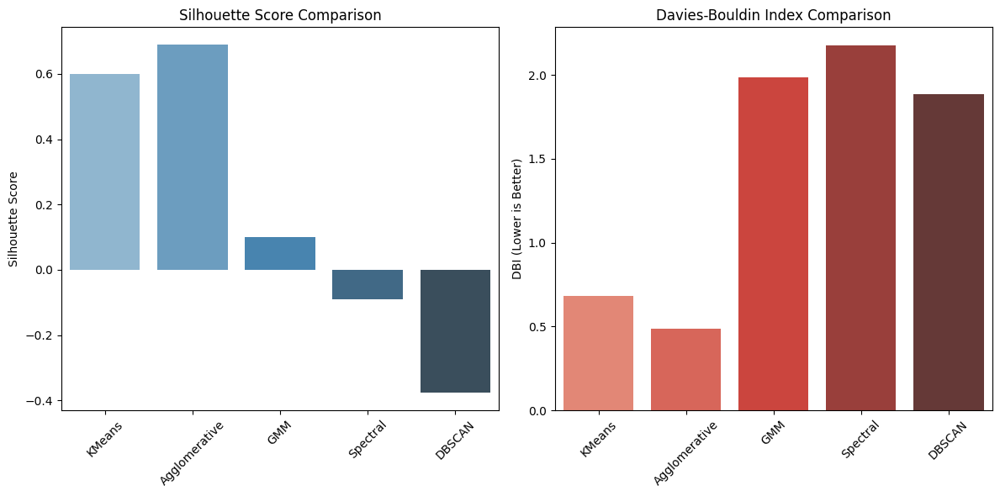

In [79]:
# Function to plot comparison of clustering models
def plot_clustering_results(clustering_results):
    """
    Plots a comparison of clustering models using Silhouette Score and Davies-Bouldin Index.

    Args:
    - clustering_results: A dictionary containing model names and their corresponding silhouette scores and DBIs.
    """
    # Extract model names, Silhouette Scores, and Davies-Bouldin Indexes
    models = list(clustering_results.keys())
    silhouette_scores = [clustering_results[model]['silhouette'] for model in models]
    dbi_scores = [clustering_results[model]['DBI'] for model in models]

    # Plot Silhouette Scores
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    sns.barplot(x=models, y=silhouette_scores, palette="Blues_d")
    plt.title('Silhouette Score Comparison')
    plt.ylabel('Silhouette Score')
    plt.xticks(rotation=45)

    # Plot Davies-Bouldin Index (lower is better)
    plt.subplot(1, 2, 2)
    sns.barplot(x=models, y=dbi_scores, palette="Reds_d")
    plt.title('Davies-Bouldin Index Comparison')
    plt.ylabel('DBI (Lower is Better)')
    plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()


# Plot comparison of the clustering results
plot_clustering_results(clustering_results)

In [73]:
'''
1. KMeans Refinement (Number of clusters)
Tuning the number of clusters is the key hyperparameter for KMeans.

2. Agglomerative Clustering (Number of clusters and linkage method)
For Agglomerative Clustering, we can refine the number of clusters and linkage method.

3. DBSCAN (eps and min_samples)
DBSCAN requires refinement of eps (radius of neighborhood) and min_samples.

4. Gaussian Mixture Model (Covariance type)
For GMM, you can refine the covariance type to optimize the model.

'''


'\n1. KMeans Refinement (Number of clusters)\nTuning the number of clusters is the key hyperparameter for KMeans.\n\n2. Agglomerative Clustering (Number of clusters and linkage method)\nFor Agglomerative Clustering, we can refine the number of clusters and linkage method.\n\n3. DBSCAN (eps and min_samples)\nDBSCAN requires refinement of eps (radius of neighborhood) and min_samples.\n\n4. Gaussian Mixture Model (Covariance type)\nFor GMM, you can refine the covariance type to optimize the model.\n\n'

In [74]:
'''Explanation of Key Refinements:
KMeans:

n_clusters: You can experiment with different values to find the optimal number of clusters.
Agglomerative Clustering:

n_clusters: Number of clusters to form.
linkage: Method to calculate distances between clusters ('ward', 'complete', 'average', 'single').
DBSCAN:

eps: Radius around each point to look for neighbors.
min_samples: Minimum number of samples required in a neighborhood to form a core point.
Gaussian Mixture Model:

n_components: Number of mixture components (clusters).
covariance_type: Shape of the clusters ('full', 'tied', 'diag', 'spherical').'''

"Explanation of Key Refinements:\nKMeans:\n\nn_clusters: You can experiment with different values to find the optimal number of clusters.\nAgglomerative Clustering:\n\nn_clusters: Number of clusters to form.\nlinkage: Method to calculate distances between clusters ('ward', 'complete', 'average', 'single').\nDBSCAN:\n\neps: Radius around each point to look for neighbors.\nmin_samples: Minimum number of samples required in a neighborhood to form a core point.\nGaussian Mixture Model:\n\nn_components: Number of mixture components (clusters).\ncovariance_type: Shape of the clusters ('full', 'tied', 'diag', 'spherical')."

In [86]:
#Model refinement function

# Function to apply and refine different clustering models
def refine_clustering_models(X, model_type, params):
    """
    Refines clustering models based on input parameters.

    Args:
    - X: Scaled input features.
    - model_type: Clustering algorithm ('kmeans', 'agglomerative', 'dbscan', 'gmm').
    - params: Dictionary of model parameters to tune.

    Returns:
    - Labels of the clustering, Silhouette Score, and Davies-Bouldin Index.
    """
    if model_type == 'kmeans':
        n_clusters = params.get('n_clusters', 3)  # Default to 3 clusters
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        labels = kmeans.fit_predict(X)

    elif model_type == 'agglomerative':
        n_clusters = params.get('n_clusters', 3)  # Default to 3 clusters
        linkage = params.get('linkage', 'ward')  # 'ward', 'complete', 'average', 'single'
        agglomerative = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage)
        labels = agglomerative.fit_predict(X)

    elif model_type == 'dbscan':
       eps = params.get('eps', 0.5)  # Neighborhood size
       min_samples = params.get('min_samples', 5)  # Minimum number of points
       dbscan = DBSCAN(eps=eps, min_samples=min_samples)
       labels = dbscan.fit_predict(X)


    elif model_type == 'agglomerative':
       n_clusters = params.get('n_clusters', 3)  # Default to 3 clusters
       linkage = params.get('linkage', 'ward')  # 'ward', 'complete', 'average', 'single'
       agglomerative = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage)
       labels = agglomerative.fit_predict(X)

    elif model_type == 'dbscan':
        eps = params.get('eps', 0.5)  # Neighborhood size
        min_samples = params.get('min_samples', 5)  # Minimum number of points
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(X)

    elif model_type == 'gmm':
        n_components = params.get('n_components', 3)  # Default to 3 clusters
        covariance_type = params.get('covariance_type', 'full')  # 'full', 'tied', 'diag', 'spherical'
        gmm = GaussianMixture(n_components=n_components, covariance_type=covariance_type, random_state=42)
        labels = gmm.fit_predict(X)

    elif model_type == 'spectral':
        n_clusters = params.get('n_clusters', 3)  # Default to 3 clusters
        spectral = SpectralClustering(n_clusters=n_clusters, random_state=42, affinity='nearest_neighbors')
        labels = spectral.fit_predict(X)

    else:
        raise ValueError("Invalid model_type. Choose from 'kmeans', 'agglomerative', 'dbscan', 'gmm'.")

    # Compute evaluation metrics
    if len(np.unique(labels)) > 1:  # To ensure silhouette and DBI can be calculated
        silhouette = silhouette_score(X, labels)
        dbi = davies_bouldin_score(X, labels)
    else:
        silhouette, dbi = -1, -1  # Invalid for 1 or fewer clusters

    return labels, silhouette, dbi


##**6.3 Evaluation**

In [87]:
# Refine KMeans with a range of cluster numbers
params_kmeans = {'n_clusters': 5}
labels_kmeans, silhouette_kmeans, dbi_kmeans = refine_clustering_models(df_scaled, 'kmeans', params_kmeans)
print(f"KMeans - Silhouette Score: {silhouette_kmeans}, DBI: {dbi_kmeans}")

# Refine Agglomerative Clustering with a different linkage method and number of clusters
params_agg = {'n_clusters': 4, 'linkage': 'average'}
labels_agg, silhouette_agg, dbi_agg = refine_clustering_models(df_scaled, 'agglomerative', params_agg)
print(f"Agglomerative Clustering - Silhouette Score: {silhouette_agg}, DBI: {dbi_agg}")

# Refine DBSCAN with different eps and min_samples
params_dbscan = {'eps': 0.3, 'min_samples': 10}
labels_dbscan, silhouette_dbscan, dbi_dbscan = refine_clustering_models(df_scaled, 'dbscan', params_dbscan)
print(f"DBSCAN - Silhouette Score: {silhouette_dbscan}, DBI: {dbi_dbscan}")

# Refine Gaussian Mixture Model (GMM) with different covariance type
params_gmm = {'n_components': 4, 'covariance_type': 'diag'}
labels_gmm, silhouette_gmm, dbi_gmm = refine_clustering_models(df_scaled, 'gmm', params_gmm)
print(f"GMM - Silhouette Score: {silhouette_gmm}, DBI: {dbi_gmm}")

# Refine DBSCAN with different eps and min_samples
params_dbscan = {'eps': 0.3, 'min_samples': 10}
labels_dbscan, silhouette_dbscan, dbi_dbscan = refine_clustering_models(df_scaled, 'dbscan', params_dbscan)
print(f"DBSCAN - Silhouette Score: {silhouette_dbscan}, DBI: {dbi_dbscan}")

params_spectral = {'n_clusters': 4}  # Adjust n_clusters as needed
labels_spectral, silhouette_spectral, dbi_spectral = refine_clustering_models(df_scaled, 'spectral', params_spectral)
print(f"Spectral Clustering - Silhouette Score: {silhouette_spectral}, DBI: {dbi_spectral}")


KMeans - Silhouette Score: 0.4115330423511908, DBI: 1.0260104984774323
Agglomerative Clustering - Silhouette Score: 0.6811875369894123, DBI: 0.5985079024203518
DBSCAN - Silhouette Score: -0.3874323425666954, DBI: 1.9810631272087453
GMM - Silhouette Score: 0.23117517267011622, DBI: 1.8834931843452734
DBSCAN - Silhouette Score: -0.3874323425666954, DBI: 1.9810631272087453
Spectral Clustering - Silhouette Score: 0.16608953343419944, DBI: 1.9198203345241271


In [88]:
# Create a dictionary to store results
clustering_plot_results = {
    'KMeans': {'silhouette': silhouette_kmeans, 'DBI': dbi_kmeans},
    'Agglomerative': {'silhouette': silhouette_agg, 'DBI': dbi_agg},
    'DBSCAN': {'silhouette': silhouette_dbscan, 'DBI': dbi_dbscan},
    'GMM': {'silhouette': silhouette_gmm, 'DBI': dbi_gmm},
    'Spectral': {'silhouette': silhouette_spectral, 'DBI': dbi_spectral}
}

##**6.4 Evaluation Metrics Comparison Plot**

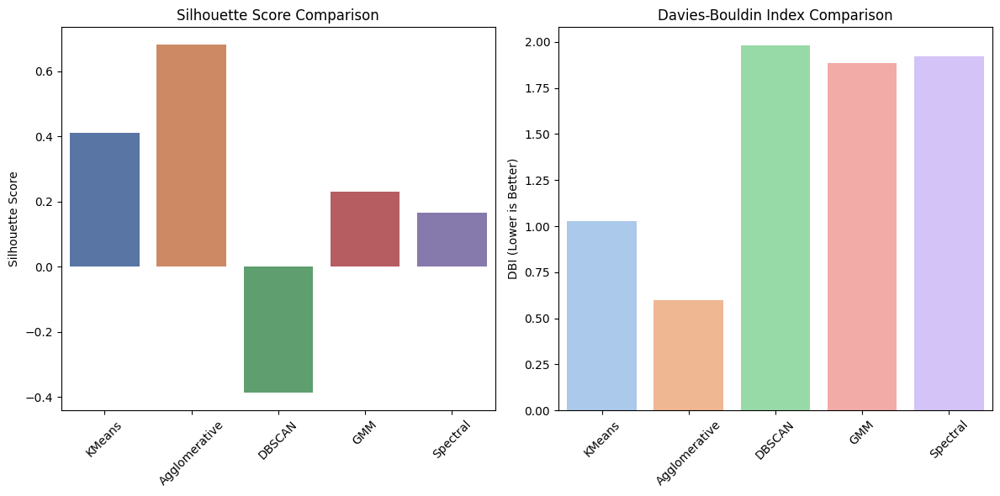

In [90]:
# Function to plot comparison of clustering models
def plot_clustering_results(clustering_results):
    """
    Plots a comparison of clustering models using Silhouette Score and Davies-Bouldin Index.

    Args:
    - clustering_results: A dictionary containing model names and their corresponding silhouette scores and DBIs.
    """
    models = list(clustering_results.keys())
    silhouette_scores = [clustering_results[model]['silhouette'] for model in models]
    dbi_scores = [clustering_results[model]['DBI'] for model in models]

    # Plot Silhouette Scores
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    sns.barplot(x=models, y=silhouette_scores, palette="deep")
    plt.title('Silhouette Score Comparison')
    plt.ylabel('Silhouette Score')
    plt.xticks(rotation=45)

    # Plot Davies-Bouldin Index (lower is better)
    plt.subplot(1, 2, 2)
    sns.barplot(x=models, y=dbi_scores, palette="pastel")
    plt.title('Davies-Bouldin Index Comparison')
    plt.ylabel('DBI (Lower is Better)')
    plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()

# Plot comparison of the clustering results
plot_clustering_results(clustering_plot_results)

#**Step7: Interpretation and Analysis**

In [93]:
#Important Features Interpretation:
cluster_summary_agg = df_scaled.groupby('Cluster').mean()
cluster_summary_agg

,Birth Rate,CO2 Emissions,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Infant Mortality Rate,Internet Usage,Lending Interest,...,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound,GDP per Capita,KMeans_3_Clusters,KMeans_4_Clusters,Hierarchical Cluster,DBSCAN Cluster
Cluster,,,,,,,,,,,,,,,,,,,,,
0,-0.428414,-0.094083,0.010990,-0.119595,-0.151036,-0.220491,-0.258059,-0.448518,-0.019914,-0.043186,...,0.004531,-0.086207,0.266226,-0.184332,-0.226750,-1.019892e-06,0.867794,2.0,2.996925,0.670254
1,-1.005590,0.077481,-0.382798,0.131042,0.378336,0.973299,1.469687,-0.925649,1.484239,-0.329382,...,1.473995,-0.071835,0.885315,0.633976,0.754723,-2.200928e-07,1.000000,3.0,3.000000,-0.229167
2,-0.861145,8.468859,-0.240481,8.838897,7.559558,0.211152,2.012954,-0.637646,0.711723,-0.625268,...,0.695084,6.215244,0.232022,6.325261,5.325218,2.123480e-08,2.000000,1.0,2.000000,-1.000000
3,1.184437,-0.150479,0.195872,-0.152863,-0.202511,-0.207150,-0.470514,1.164339,-0.785989,0.257018,...,-0.815479,-0.016677,-0.866604,-0.255240,-0.229343,-1.838344e-07,0.000000,0.0,1.010033,1.267559


###**7.1Analysis of Important Features of Agglomerative Clustering(best model)**







In [ ]:
'''1. Examine Cluster Centers
Agglomerative Clustering does not produce cluster centers like KMeans, but you can analyze the mean values of features for each cluster to understand the characteristics of the clusters.

2. Feature Importance
While Agglomerative Clustering does not provide explicit feature importance like tree-based models, you can calculate the mean of the features for each cluster to see which features differ significantly across clusters.

3. Visualization
Visualizing the features can help interpret how each contributes to the clustering:

Pair Plots: Show how different features relate to each other across clusters.
Box Plots: Display the distribution of important features for each cluster.'''

Mean feature values for each cluster:
         Birth Rate  CO2 Emissions  Days to Start Business  Energy Usage  \
Cluster                                                                    
0         -0.428414      -0.094083                0.010990     -0.119595   
1         -1.005590       0.077481               -0.382798      0.131042   
2         -0.861145       8.468859               -0.240481      8.838897   
3          1.184437      -0.150479                0.195872     -0.152863   

              GDP  Health Exp % GDP  Health Exp/Capita  Infant Mortality Rate  \
Cluster                                                                         
0       -0.151036         -0.220491          -0.258059              -0.448518   
1        0.378336          0.973299           1.469687              -0.925649   
2        7.559558          0.211152           2.012954              -0.637646   
3       -0.202511         -0.207150          -0.470514               1.164339   

         Internet 

<Figure size 1200x600 with 0 Axes>

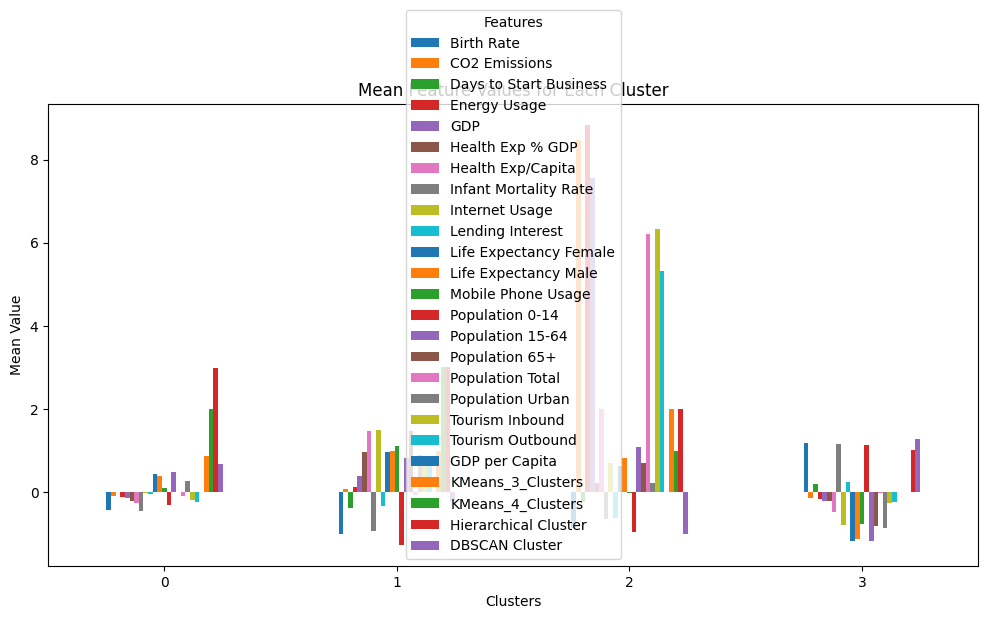

In [ ]:
# Assuming 'labels_agg' are the cluster labels from Agglomerative Clustering

# Calculate the mean of features for each cluster
feature_means = df_scaled.groupby('Cluster').mean()

print("Mean feature values for each cluster:")
print(feature_means)

# Visualize the mean values of features for each cluster
plt.figure(figsize=(12, 6))
feature_means.plot(kind='bar', figsize=(12, 6))
plt.title("Mean Feature Values for Each Cluster")
plt.ylabel("Mean Value")
plt.xlabel("Clusters")
plt.xticks(rotation=0)
plt.legend(title="Features")
plt.show()

# Pair plot to visualize the distribution of features across clusters
sns.pairplot(df, hue='Cluster', palette='tab10')
plt.title("Pair Plot of Features Colored by Cluster")
plt.show()

# Box plots for selected important features
important_features = ['feature1', 'feature2', 'feature3']  # Replace with actual feature names
plt.figure(figsize=(15, 8))
for i, feature in enumerate(important_features, 1):
    plt.subplot(1, len(important_features), i)
    sns.boxplot(x='Cluster', y=feature, data=df, palette='tab10')
    plt.title(f"Box Plot of {feature} by Cluster")
plt.tight_layout()
plt.show()
